In [1]:
##Importing the packages

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
##Importing the dataset

comments = pd.read_csv('A:\DataScience Projects\YoutubeAnalysis\GBcomments.csv',error_bad_lines = False)


b'Skipping line 113225: expected 4 fields, saw 5\n'
b'Skipping line 158379: expected 4 fields, saw 7\nSkipping line 241590: expected 4 fields, saw 5\nSkipping line 245637: expected 4 fields, saw 7\n'
b'Skipping line 521402: expected 4 fields, saw 5\n'


In [3]:
comments.head()

,video_id,comment_text,likes,replies
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0


In [4]:
from textblob import TextBlob

In [5]:
comments.isna().sum()

video_id         0
comment_text    28
likes            0
replies          0
dtype: int64

In [6]:
comments.dropna(inplace = True)

### Sentiment Analysis

In [7]:
#Checking the sentiment of each comment
pol = []

for i in comments['comment_text']:
    pol.append(TextBlob(i).sentiment.polarity)

In [8]:
comments['polarity'] = pol

In [9]:
comments.head(10)

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.450000
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.000000
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.000000
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.000000
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.000000
5,jt2OHQh0HoQ,Keep calm and buy iphone 8 Keep calm and buy i...,0,0,0.300000
6,jt2OHQh0HoQ,i am a big fan of youtube and u !!!!!!!!!!!!!,0,0,0.000000
7,jt2OHQh0HoQ,You will never find Losers who line up and pay...,0,0,-0.100000
8,jt2OHQh0HoQ,*APPLE JUST COMMENTED ON MY LAST VIDEO* I'm cr...,0,0,0.028571
9,jt2OHQh0HoQ,"I'm only here to see Emma, I love her so much!...",0,0,0.500000


Positive polarity indicates a positive comment.
Negative polarity indicates a negative comment.

### EDA for positive comments

In [10]:
#Filtering the positve comments.
positive_comments = comments[comments['polarity']==1]

In [11]:
positive_comments.head()

,video_id,comment_text,likes,replies,polarity
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.0
26,jt2OHQh0HoQ,The best thing to ever happen to iPhone,0,2,1.0
80,jt2OHQh0HoQ,Apple is always awesome \n\nhttps://youtu.be/r...,0,1,1.0
158,YPVcg45W0z4,das a lot of edditing you have done there ... ...,0,0,1.0
175,YPVcg45W0z4,Welcome to the Scandiworld!,0,0,1.0


In [12]:
from wordcloud import WordCloud,STOPWORDS

In [13]:
stop = set(STOPWORDS)

In [14]:
total_positive = "".join(positive_comments['comment_text'])

In [15]:
total_positive

"Power is the disease.\xa0 Care is the cure.\xa0 Keep caring for yourself and others as best as you can.\xa0 This is life.The best thing to ever happen to iPhoneApple is always awesome \\n\\nhttps://youtu.be/rftzm6X1yP4das a lot of edditing you have done there ... I like it :DWelcome to the Scandiworld!Power is the disease.\xa0 Care is the cure.\xa0 Keep caring for yourself and others as best as you can.\xa0 This is life.WHY DO I KEEP FREAKING LAUGHING EACH TIME I WATCH IT AGAIN ! even though I know how it will end. omg the best 😂LIKE = MEET CELEBRITY \\nSUBSCRIBE = BECOME A BILLIONAIRE\\nSCROLL UP/DOWN = DEATH FOR YOU AND EVERYONE YOU LOVE!!!!!!!!!!!!!!!!!!!!!!!!!!!!!the sonic air timer was perfectno 16 on trending impressiveMy daughters name is lacey <3I'm 17 and can proudly say Moon Dreamers was one of my favourite shows!if I could subscribe to Dude Perfect a million times I wouldYou guys should make dude perfect sceetsTo be a dude perfect member it is so awesome ....Dude Perfect sh

In [16]:
pwc = WordCloud(height = 1400, width = 1000,stopwords = stop).generate(total_positive)

(-0.5, 999.5, 1399.5, -0.5)

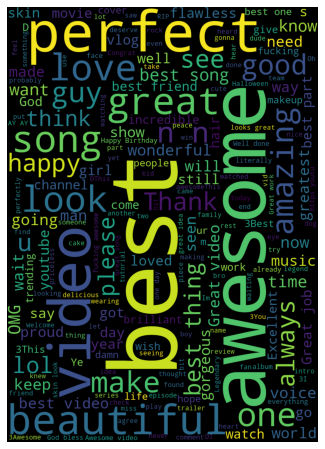

In [17]:
plt.figure(figsize = (12,8))
plt.imshow(pwc)
plt.axis('off')

### EDA for negative comments

In [18]:
##Filtering the negative comments.
negative_comments = comments[comments['polarity'] == -1]

In [19]:
negative_comments.head()

,video_id,comment_text,likes,replies,polarity
1387,ql0Op1VcELw,boring,0,0,-1.0
1394,ql0Op1VcELw,0:22 **laughs at terrible pun**,1,1,-1.0
1530,-Ifnaxi2LQg,this is the worst thing i've heard. ever.,0,0,-1.0
1745,F2uJvwiSZAQ,People making jokes about 9/11 is truly disgus...,1,0,-1.0
1793,F2uJvwiSZAQ,Thats insane.,0,0,-1.0


In [20]:
total_negative = "".join(negative_comments['comment_text'])

In [21]:
total_negative

"boring0:22   **laughs at terrible pun**this is the worst thing i've heard. ever.People making jokes about 9/11 is truly disgusting. Hundreds of people died for God's sake - have some respect.Thats insane.How is this trending ? AwfulButthurt Sean, idiot!Nigga nigga nigga ni... Fucking.... Nigga!!!!!!!!Just gone and bought these bad boys!!!! ❤️❤️❤️❤️ had an alarm set in my phone and everythingPlease let this die, you can tell the actors are miserable.can't wait :'(Don't be bringing cucumbers to the theaters this time!! You know who you are, ya nastyHandmaids Tale was boring, I foundI won't read this comment. What a Dick I am, I can't believe I just read this. I am pathetic!all the products are horriblejim carrey lost it, became a boring socialist hippyWinner Tacos were my favourite growing up too! People always thought I was insane when I described it amd kept on claiming that I was just misremembering Maxibons.Terrible, at times like this we need to come together not stealYour style is

In [22]:
nwc = WordCloud(height = 1400, width = 1000, stopwords = stop).generate(total_negative)

(-0.5, 999.5, 1399.5, -0.5)

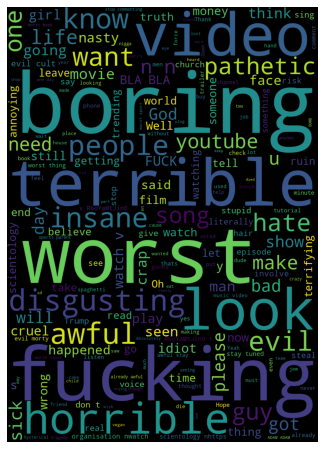

In [23]:
plt.figure(figsize = (12,8))
plt.imshow(nwc)
plt.axis('off')

### What are the trending tags on youtube?

In [24]:
videos = pd.read_csv('A:\DataScience Projects\YoutubeAnalysis/USvideos.csv',error_bad_lines = False)

b'Skipping line 2401: expected 11 fields, saw 21\nSkipping line 2800: expected 11 fields, saw 21\nSkipping line 5297: expected 11 fields, saw 12\nSkipping line 5299: expected 11 fields, saw 12\nSkipping line 5300: expected 11 fields, saw 12\nSkipping line 5301: expected 11 fields, saw 12\n'


In [25]:
videos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,thumbnail_link,date
0,XpVt6Z1Gjjo,1 YEAR OF VLOGGING -- HOW LOGAN PAUL CHANGED Y...,Logan Paul Vlogs,24,logan paul vlog|logan paul|logan|paul|olympics...,4394029,320053,5931,46245,https://i.ytimg.com/vi/XpVt6Z1Gjjo/default.jpg,13.09
1,K4wEI5zhHB0,iPhone X — Introducing iPhone X — Apple,Apple,28,Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...,7860119,185853,26679,0,https://i.ytimg.com/vi/K4wEI5zhHB0/default.jpg,13.09
2,cLdxuaxaQwc,My Response,PewDiePie,22,[none],5845909,576597,39774,170708,https://i.ytimg.com/vi/cLdxuaxaQwc/default.jpg,13.09
3,WYYvHb03Eog,Apple iPhone X first look,The Verge,28,apple iphone x hands on|Apple iPhone X|iPhone ...,2642103,24975,4542,12829,https://i.ytimg.com/vi/WYYvHb03Eog/default.jpg,13.09
4,sjlHnJvXdQs,iPhone X (parody),jacksfilms,23,jacksfilms|parody|parodies|iphone|iphone x|iph...,1168130,96666,568,6666,https://i.ytimg.com/vi/sjlHnJvXdQs/default.jpg,13.09


In [26]:
all_tags = ' '.join(videos['tags'])

In [27]:
all_tags

"logan paul vlog|logan paul|logan|paul|olympics|logan paul youtube|vlog|daily|comedy|hollywood|parrot|maverick|bird|maverick clothes|diamond play button|logan paul diamond play button|10M subscribers|logan paul 1 year vlogging|1 year vlog|dwarf mamba play button|logan paul history|youtube history|10M|10M plaque|youtube button|diamond button|logang|logang 4 life Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lighting|A11 Bionic|augmented reality|emoji|animoji|Face ID|Apple Pay|camera|smartphone [none] apple iphone x hands on|Apple iPhone X|iPhone X|apple iphone x first look|iPhone X first look|apple iphone x event 2017|apple iphone x event|iPhone X price|iPhone X specs|iPhone X design|iPhone X camera|iPhone X home button|iPhone X wireless charging|iPhone X waterproof|iPhone X release date|iphone 2017|apple|iphone|ios 11|the verge|verge jacksfilms|parody|parodies|iphone|iphone x|iphone 8|apple|emoji a24|a24 films|a24 trailers|independent films|trailer|HD|official|movie|film|a24 movies|oscar 

In [28]:
import re

In [29]:
##Removing special characters
f_tags = re.sub('[^a-zA-Z]'," ",all_tags)

In [30]:
f_tags

'logan paul vlog logan paul logan paul olympics logan paul youtube vlog daily comedy hollywood parrot maverick bird maverick clothes diamond play button logan paul diamond play button   M subscribers logan paul   year vlogging   year vlog dwarf mamba play button logan paul history youtube history   M   M plaque youtube button diamond button logang logang   life Apple iPhone    iPhone Ten iPhone Portrait Lighting A   Bionic augmented reality emoji animoji Face ID Apple Pay camera smartphone  none  apple iphone x hands on Apple iPhone X iPhone X apple iphone x first look iPhone X first look apple iphone x event      apple iphone x event iPhone X price iPhone X specs iPhone X design iPhone X camera iPhone X home button iPhone X wireless charging iPhone X waterproof iPhone X release date iphone      apple iphone ios    the verge verge jacksfilms parody parodies iphone iphone x iphone   apple emoji a   a   films a   trailers independent films trailer HD official movie film a   movies oscar 

In [31]:
f_tags = re.sub(' +',' ',f_tags)

In [32]:
f_tags

'logan paul vlog logan paul logan paul olympics logan paul youtube vlog daily comedy hollywood parrot maverick bird maverick clothes diamond play button logan paul diamond play button M subscribers logan paul year vlogging year vlog dwarf mamba play button logan paul history youtube history M M plaque youtube button diamond button logang logang life Apple iPhone iPhone Ten iPhone Portrait Lighting A Bionic augmented reality emoji animoji Face ID Apple Pay camera smartphone none apple iphone x hands on Apple iPhone X iPhone X apple iphone x first look iPhone X first look apple iphone x event apple iphone x event iPhone X price iPhone X specs iPhone X design iPhone X camera iPhone X home button iPhone X wireless charging iPhone X waterproof iPhone X release date iphone apple iphone ios the verge verge jacksfilms parody parodies iphone iphone x iphone apple emoji a a films a trailers independent films trailer HD official movie film a movies oscar winner academy award winner The Disaster A

In [33]:
wc = WordCloud(height = 1500,width = 1000,stopwords = set(STOPWORDS)).generate(f_tags)

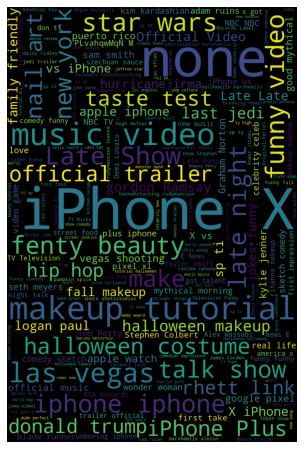

In [34]:
plt.figure(figsize = (12,8))
plt.axis('off')
plt.imshow(wc)

### Are Likes,Dislikes and Views correlated to each other?

Text(0.5, 1.0, 'Regression plot for Views & Likes')

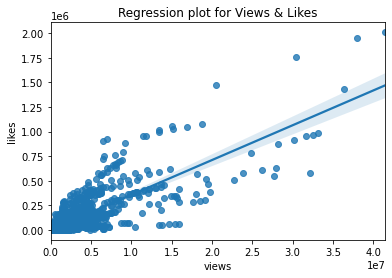

In [35]:
##Using a regression plot for 'Likes' and 'Views'
sns.regplot(x = 'views', y = 'likes',data = videos)
plt.title('Regression plot for Views & Likes')

Likes increase with views which implies the number of likes have very strong relation with views.

Text(0.5, 1.0, 'Regression plot for Views & Dislikes')

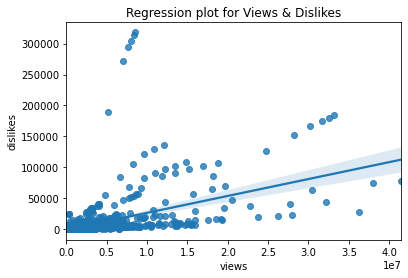

In [36]:
##Using a regression plot for 'Likes' and 'Views'
sns.regplot(x = 'views', y = 'dislikes',data = videos)
plt.title('Regression plot for Views & Dislikes')

Dislikes not necessarily increase when the views are increasing.

#### Correlation Matrix

In [37]:
df_corr = videos[['views','likes','dislikes']]

In [38]:
df_corr.corr()

,views,likes,dislikes
views,1.000000,0.832844,0.541955
likes,0.832844,1.000000,0.497439
dislikes,0.541955,0.497439,1.000000


<AxesSubplot:>

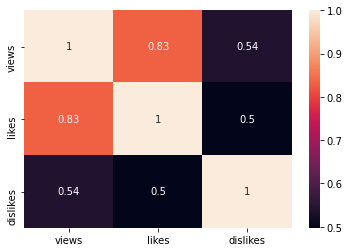

In [39]:
sns.heatmap(df_corr.corr(),annot=True)

### Analysis of the emojis in the comment section

In [40]:
import emoji

In [41]:
len(comments)

718424

In [42]:
str=''
for i in comments['comment_text']:
    list=[c for c in i if c in emoji.UNICODE_EMOJI['en']]
    for ele in list:
        str=str+ele

In [43]:
len(str)

333278

In [44]:
print(str)

😂😂😂😭😭😭😢😢😢❤❤😂👏👇👇👇👇👇👇👇👇👇👇🌞😎😣😥😫😭✌😂👎🏻👎🏻👎🏻👎🏻😂🖕😘😘▶⏭⏮◀🔥🔥😊😊🤔🤔😂😂😂😂👏🏻👏🏻❤❤😜😍😍😅❤😍😍✌😂😂😂😊😂😂😂😂😏😏😭💔😊❤❤❤❤❤😂😂😊❤😂🤣✨🌈😘😂😂❤😊😂😊😂💗😂😊😊😊💖🐢😉😍😂😂💗💗😻😻❤😂😂❤❤🤗👌🏼👌🏼😂😂😂😂💖😩🙊♥♥♥😂😂😂💙💙💙💙💙💙😂😂😂❤❤❤😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😂😱😊😛🌳🌽🎃🚣🚂😂😂😊😕😋🤣😅😢💔😂😊🤡🙏🙏🙏👊🏿🙇🏽👋😅😅😅😅😂😂🤔😎😎😎😎😎😎😎😍😍😍😍😍😍😘😘😘😘😘😘😘😲🖕💪🤘💓☺☺😂😂😂💕😄😄😍💕😉😩❤❤💕❤😂💕😍💗👫💖😆💕💖💕😍😍😊😄😍😀💗🦄😍😊😂😊👍😍♥❤😂👶🏻🤗☺😘💙💙💙😍😍😊😎🤘🖤👌👌😍😂👌🍍😎😎😄😄😄😄😂😂😂😬💜💜💜😭😂😍😍💖😂😂😂😂😂😂😂😭😂😭😂😭😂😂😂😍😍😍😭😍😍😂👀👀🤔😂😂😂😂😂😂😂😂😂😂🍸🍸🍸🍸🍸😂😂😂🤣🤣🤣😂😂😂😂😍💜💜💜💜😂😂😂😅😂😍💖😂😻😉🔥❤😻❤😭😭😭😭😭😭😭👍🏻😍💚💙❤❤😫❤❤❤❤❤♥😍❤😊😍😎💄🐐😅😂😂😊😊👀👌🏽❤❤❤😂💖🎉💪💪🏽😎🙌🙌😜❤❤💛💛😎🙏💚🎉🎉❤🎉🎉🎉🎉🎊🎉🎊🎉😭💗😍😍😍😍😍😍😍👏✌😁❤❤😂💋💋👫💘😻💋💋😂👑🔥🔥🔥🔥🔥🔥🔥🔥🔥🔥😂😐😑😩👌🏻🔥💖👏🏻👀✨👅💦💕❤😍🔥🔥🔥❤❤❤❤❤❤❤👌😍😍😍😞🌴💜💜💜💜😍😍😍😍😍❤❤❤❤❤😊❤❤❤❤🍔🍟😒🌿😄😄😄😉🍲🍱🎏❤💪👊🏽😘😂😂😂❤🙋☺😍😍😚💕😉😂❤❤😊☺💓🌸🙄🙄🙄🙁😞😊🙄😍😨😍😍😍😍😎😃😂😍😏😌😂😎🤑😂😉👍🏻🔥💯🚨😊☺😂😂😂🤣🙂❤❤😀😀😀♥♥😂❤😂😓😭😂❤❤😖😖😂😂😂💗💝😘💐💐💐😂😍☺😂❤😭💕🙌🏽🙌🏽🙌🏽😘😘❤❤💖😫😖📱😂😏🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗😁🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗🤗😎😂😂👍🏼💯💕♥♥♥😱😱😱❤❤❤😍😍😩😩😩😩😩😩😩😍😻😻😻😻😻😳🥀♥♥♥♥♥♥😍😍😍🙃😂💕💕💕😍💕💕❤❤💕😍🍫🌹💖❤😍👸🏿👸🏿👸🏿👸🏿👸🏿💗😊😊😩❤👌🏼😻😊😍❤😂😂👏🏼❤❤❤❤❤😍😍😍💚💚💚💚💚😍😭🌹😍❤😍😍😍💚💚💚💚💚😍💚💚💚☺💙😀😍💚😕😍👌😂😂😂😍👌🏻💗❤💚💚💚😸😙😙😘💚💚💚💚😍😭😭💖💓💓💓😍❤😘😘🤗🤗🤗❤😀😀💓💓💓❤😂❤😍❤❤♥♥♥❤🙌❤😂❤❤😍❤💜😍😭😍😍😍😊💗💕😍❤💗💗💛💛💛💖💖😍😐😍😍😍😍🗿😂🤗😩😩😩💖💖💖❤❤❤❤❤😍😍✨😍👍🏻😁😂😍💅❤😘❤❤😈👀😄😈👍☝👆✊👌✌👊✋👋👏👐👉👈💔😂😂😬😭😥☺😂😂😂😂😍😍😍😜😂😂😂😂😂😒👎🏽😱😱😱😱😂😎😛🙊✊✌😑😑😑👌😊😊😍😊❤❤❤❤😍😍

In [45]:
uni_emoji = {}
for i in set(str):
    uni_emoji[i] = str.count(i)

In [46]:
uni_emoji

{'😬': 5489,
 '💂': 18,
 '📠': 10,
 '♥': 7173,
 '🌟': 587,
 '👬': 47,
 '🤖': 16,
 '🏘': 8,
 '🍎': 52,
 '🏦': 9,
 '🌼': 92,
 '🗞': 5,
 '🛵': 9,
 '◻': 5,
 '👖': 29,
 '🐓': 98,
 '💹': 4,
 '🏹': 8,
 '↙': 9,
 '〰': 295,
 '🗼': 16,
 '🎈': 736,
 '📤': 8,
 '💿': 929,
 '🍾': 143,
 '🍣': 54,
 '😠': 473,
 '📒': 19,
 '🤭': 16,
 '😝': 417,
 '🎚': 7,
 '🧡': 2,
 '🛤': 5,
 '🔈': 7,
 '🌚': 59,
 '🎁': 106,
 '🥙': 7,
 '💑': 132,
 '👚': 27,
 '🖨': 5,
 '✉': 8,
 '🍻': 46,
 '😅': 1977,
 '🖌': 6,
 '⏫': 6,
 '🗻': 11,
 '🕢': 8,
 '🚶': 16,
 '🔗': 7,
 '⌛': 12,
 '🌦': 19,
 '🤽': 1,
 '🔑': 36,
 '💢': 17,
 '🍥': 16,
 '☯': 17,
 '🍵': 23,
 '🕰': 6,
 '🎛': 7,
 '👩': 222,
 '😔': 662,
 '👺': 52,
 '🏴': 14,
 '🔍': 11,
 '🕳': 8,
 '🧜': 5,
 '✂': 13,
 '🐥': 117,
 '🚅': 8,
 '🔤': 5,
 '🌲': 26,
 '📑': 8,
 '♿': 12,
 '🈂': 5,
 '😉': 1153,
 '🌐': 27,
 '👝': 14,
 '😆': 1423,
 '🎖': 38,
 '🎟': 6,
 '🐕': 192,
 '🌄': 17,
 '🎱': 12,
 '🗳': 5,
 '🏍': 8,
 '📖': 20,
 '🏾': 1241,
 '🚪': 16,
 '🌊': 158,
 '🔽': 7,
 '🙊': 186,
 '⛎': 9,
 '🈺': 16,
 '🤦': 439,
 '🚃': 6,
 '☎': 14,
 '☔': 25,
 '😞': 415,
 '📁': 61,
 '♟': 4,
 '💉': 2

In [47]:
##Sorting the dictionary.

final = {}
for key,value in sorted(uni_emoji.items(), key = lambda item:item[1]):
    final[key] = value


In [48]:
final 

{'🤽': 1,
 '🥚': 1,
 '🤹': 1,
 '🥨': 1,
 '🤺': 1,
 '🤾': 1,
 '🛒': 1,
 '🧠': 1,
 '🛷': 1,
 '🦓': 1,
 '🦏': 1,
 '🤟': 1,
 '🥟': 1,
 '🧤': 1,
 '🥜': 1,
 '🧣': 1,
 '🥌': 1,
 '🥡': 1,
 '🧡': 2,
 '🧒': 2,
 '🤱': 2,
 '🎌': 2,
 '🥅': 2,
 '🧘': 2,
 '🦔': 2,
 '🧝': 2,
 '🧛': 2,
 '🦖': 2,
 '🧢': 2,
 '🦕': 2,
 '🥖': 3,
 '🤫': 3,
 '🤨': 3,
 '🤯': 3,
 '🧐': 3,
 '🥄': 3,
 '💹': 4,
 '♟': 4,
 '🖍': 4,
 '🥈': 4,
 '⚗': 4,
 '🖇': 4,
 '🤵': 4,
 '🛢': 4,
 '🦐': 4,
 '⏹': 4,
 '🏌': 4,
 '🦆': 4,
 '🥞': 4,
 '⚧': 4,
 '🥝': 4,
 '⏏': 4,
 '☸': 4,
 '🧟': 4,
 '🗓': 4,
 '🛣': 4,
 '🤬': 4,
 '☦': 4,
 '♾': 4,
 '⏸': 4,
 '🏷': 4,
 '⚙': 4,
 '⏲': 4,
 '🦍': 4,
 '⏯': 4,
 '🛬': 4,
 '🗂': 4,
 '🗄': 4,
 '🗞': 5,
 '◻': 5,
 '🛤': 5,
 '🖨': 5,
 '🧜': 5,
 '🔤': 5,
 '🈂': 5,
 '🗳': 5,
 '🦒': 5,
 '⚾': 5,
 '❎': 5,
 '🛋': 5,
 '🈯': 5,
 '↪': 5,
 '↕': 5,
 '☂': 5,
 '🧖': 5,
 '🚠': 5,
 '🈲': 5,
 '🖼': 5,
 '🔖': 5,
 '🈁': 5,
 '⛸': 5,
 '🚛': 5,
 '🔄': 5,
 '🌫': 5,
 '🔁': 5,
 '🗜': 5,
 '🚟': 5,
 '🖊': 5,
 '🛥': 5,
 '🔳': 5,
 '🚁': 5,
 '🈹': 5,
 '🔃': 5,
 '⏺': 5,
 '⚒': 5,
 '🤮': 5,
 '🈵': 5,
 '🔼': 5,
 '🗒': 5,
 '♦': 5,
 '🈴': 5,
 

In [49]:
keys = [*final.keys()]

In [50]:
values = [*final.values()]

In [51]:
keys

['🤽',
 '🥚',
 '🤹',
 '🥨',
 '🤺',
 '🤾',
 '🛒',
 '🧠',
 '🛷',
 '🦓',
 '🦏',
 '🤟',
 '🥟',
 '🧤',
 '🥜',
 '🧣',
 '🥌',
 '🥡',
 '🧡',
 '🧒',
 '🤱',
 '🎌',
 '🥅',
 '🧘',
 '🦔',
 '🧝',
 '🧛',
 '🦖',
 '🧢',
 '🦕',
 '🥖',
 '🤫',
 '🤨',
 '🤯',
 '🧐',
 '🥄',
 '💹',
 '♟',
 '🖍',
 '🥈',
 '⚗',
 '🖇',
 '🤵',
 '🛢',
 '🦐',
 '⏹',
 '🏌',
 '🦆',
 '🥞',
 '⚧',
 '🥝',
 '⏏',
 '☸',
 '🧟',
 '🗓',
 '🛣',
 '🤬',
 '☦',
 '♾',
 '⏸',
 '🏷',
 '⚙',
 '⏲',
 '🦍',
 '⏯',
 '🛬',
 '🗂',
 '🗄',
 '🗞',
 '◻',
 '🛤',
 '🖨',
 '🧜',
 '🔤',
 '🈂',
 '🗳',
 '🦒',
 '⚾',
 '❎',
 '🛋',
 '🈯',
 '↪',
 '↕',
 '☂',
 '🧖',
 '🚠',
 '🈲',
 '🖼',
 '🔖',
 '🈁',
 '⛸',
 '🚛',
 '🔄',
 '🌫',
 '🔁',
 '🗜',
 '🚟',
 '🖊',
 '🛥',
 '🔳',
 '🚁',
 '🈹',
 '🔃',
 '⏺',
 '⚒',
 '🤮',
 '🈵',
 '🔼',
 '🗒',
 '♦',
 '🈴',
 '🆎',
 '🛂',
 '🖲',
 '🎐',
 '⌨',
 '🔚',
 '🔠',
 '🥛',
 '♠',
 '🗃',
 '🕎',
 '🚻',
 '✡',
 '➿',
 '🥉',
 'Ⓜ',
 '🔣',
 '◽',
 '🔲',
 '🚉',
 'ℹ',
 '🚎',
 '↖',
 '↩',
 '⛏',
 '🔡',
 '🆔',
 '⛴',
 '🏮',
 '⛩',
 '🔂',
 '🈳',
 '⛱',
 '🔢',
 '㊙',
 '🆖',
 '↔',
 '🕹',
 '🖌',
 '⏫',
 '🕰',
 '🎟',
 '🚃',
 '🕍',
 '📧',
 '🛃',
 '📵',
 '🕴',
 '♻',
 '🚯',
 '⏭',
 '🔀',
 '🏐',
 '🚇',
 '⏱',
 '🚐'

In [52]:
values

[1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 2,
 3,
 3,
 3,
 3,
 3,
 3,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 4,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 5,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 6,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,
 7,


In [53]:
##Top 30 emojis
df=pd.DataFrame({'chars':keys[-30:],'num':values[-30:]})

In [54]:
df

,chars,num
0,🏽,1875
1,🙏,1886
2,😩,1924
3,😅,1977
4,😢,2074
5,💚,2138
6,💛,2169
7,😱,2316
8,🤣,2374
9,😁,2504


In [55]:
import plotly.graph_objs as go
from plotly.offline import iplot

In [56]:
trace=go.Bar(x=df['chars'],y=df['num'])

iplot([trace])

We can clearly see that laughing emojis is used the most in the comments section.